In [1]:
from CGL import CGL
import numpy as np
import matplotlib.pyplot as plt

$$d_t (A) = (1+ic_1) \nabla ^2 A + A - (1+ic_2)|A|^2A$$ 

In [2]:
gl = CGL(c1=0.0, c2=1.5, msize=128)

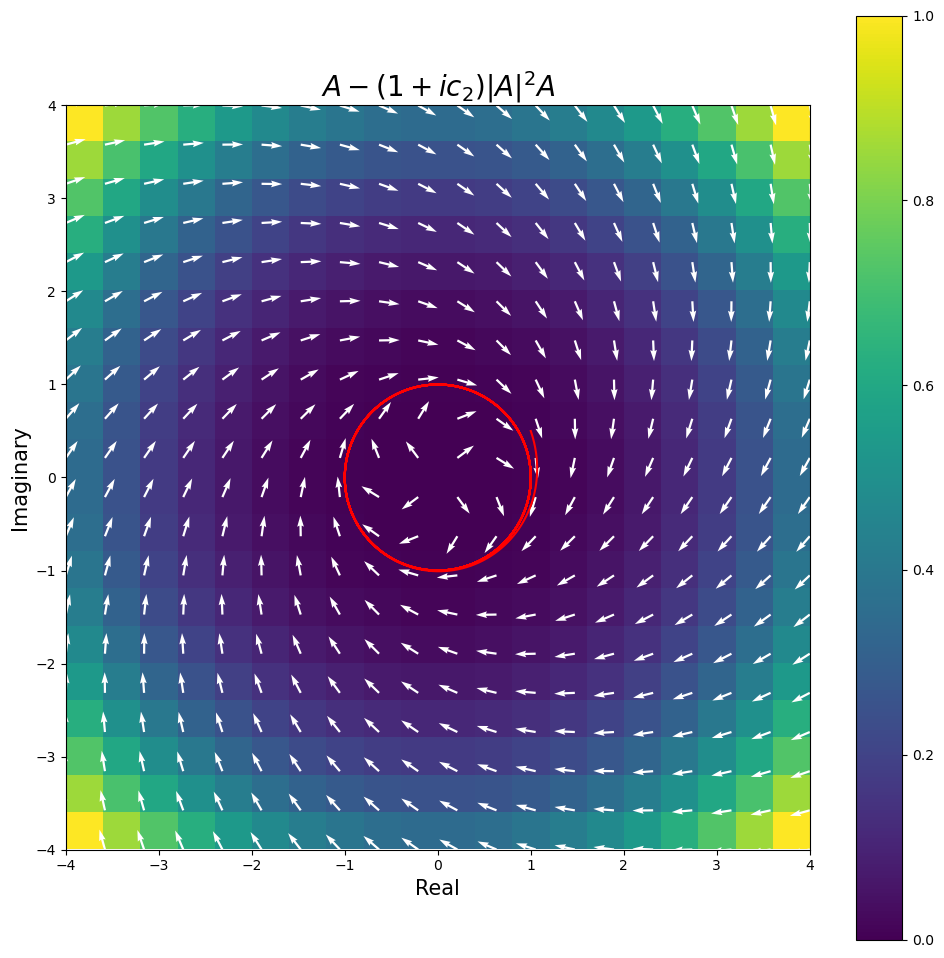

In [3]:
nVec = 20
fromTo = (-4.0,4.0)
a0 = 1+0.5j

it = gl.getChainedSingleReaction(a0=a0, dt = 0.01,nit = 3000)

x,y = np.meshgrid(np.linspace(*fromTo,nVec),np.linspace(*fromTo,nVec))
states = x+1j*y
reactionDer = gl.reaction(states,0.0)
mods = np.abs(reactionDer)
mods[mods<1e-10] = 1

plt.figure(figsize = (12,12))
plt.imshow(mods,origin='lower',extent=(*fromTo,*fromTo))
plt.quiver(x, y, np.real(reactionDer)/mods, np.imag(reactionDer)/mods,color='white')
plt.plot(np.real(it),np.imag(it),color='r')
plt.xlabel("Real",fontsize=15)
plt.ylabel("Imaginary",fontsize=15)
plt.title(r"$A - (1+ic_2)|A|^2A$",fontsize=20)

plt.colorbar()
plt.show()

# Curiosidade

100%|███████████████████████████████████████| 1500/1500 [00:55<00:00, 26.89it/s]


(1501, 128, 128)


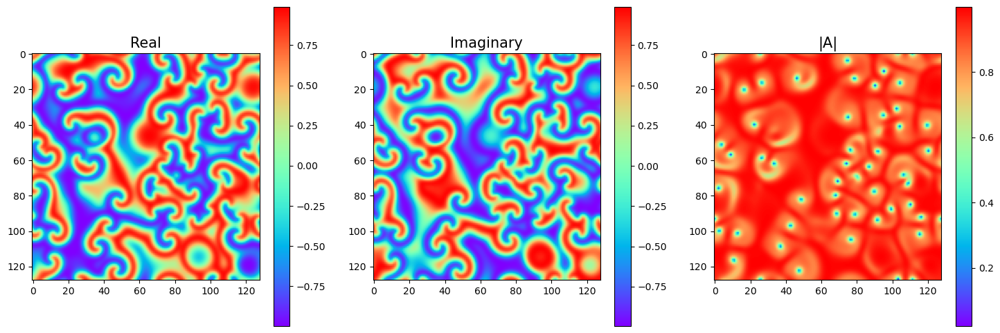

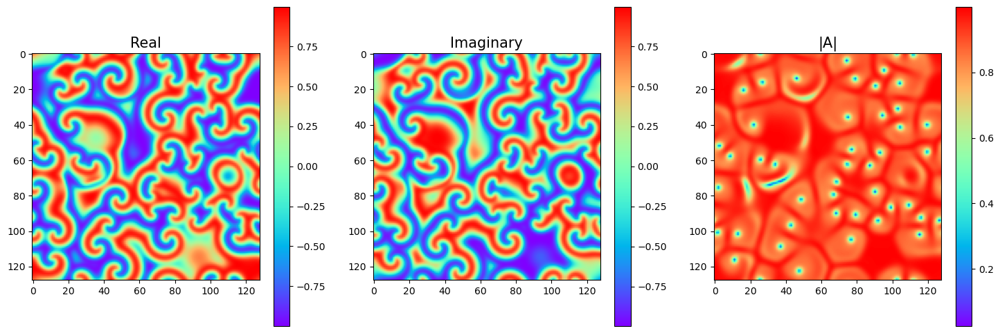

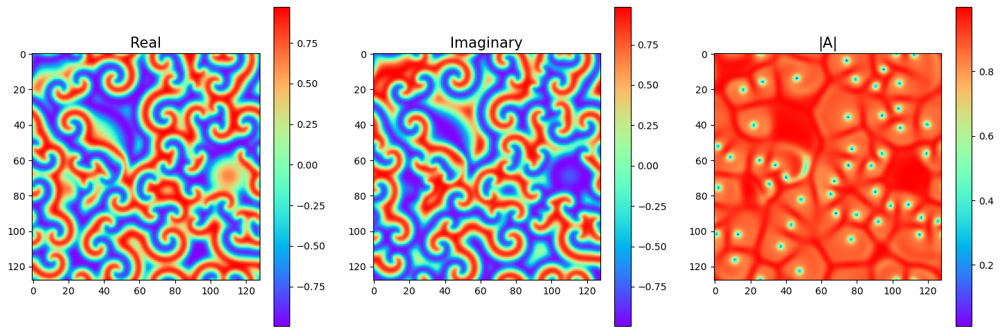

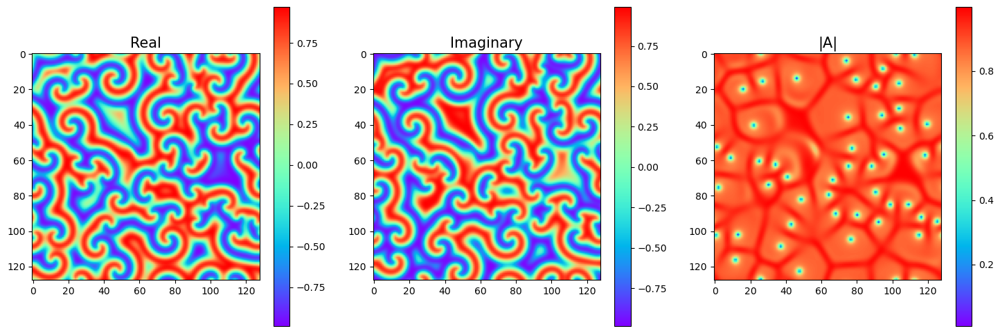

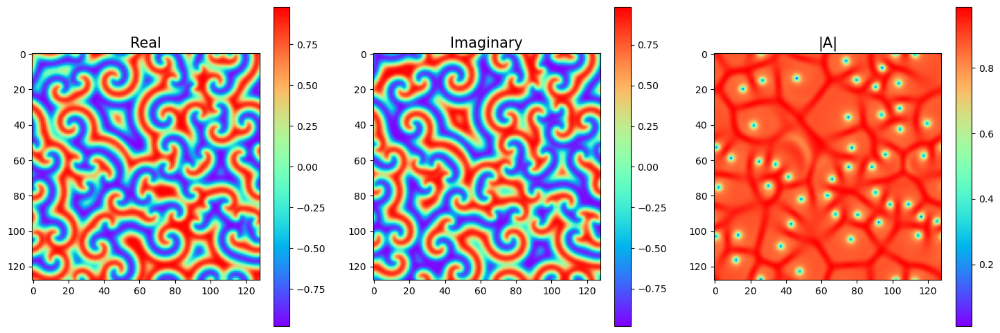

In [2]:
gl = CGL(c1=0.0, c2=1.5,msize=128)
data,times = gl.solveRKF45(dt=0.05,ntimes=1500,stepsave=np.arange(2500))
print(data.shape)

plotSnap = [500,700,900,1100,1300]

for i in plotSnap:
    plt.figure(figsize=(18,6))
    plt.subplot(1,3,1)
    plt.title("Real",fontsize=15)
    plt.imshow(np.real(data[i]),cmap='rainbow')
    plt.colorbar()
    plt.subplot(1,3,2)
    plt.title("Imaginary",fontsize=15)
    plt.imshow(np.imag(data[i]),cmap='rainbow')
    plt.colorbar()
    plt.subplot(1,3,3)
    plt.title("|A|",fontsize=15)
    plt.imshow(np.abs(data[i]),cmap='rainbow')
    plt.colorbar()

plt.show()

# 3D Plot

In [3]:
gl = CGL(c1=0.0, c2=1.55,msize=32,dim=3)
data,times = gl.solveRKF45(dt=0.03,ntimes=2000,stepsave=np.arange(4500))

100%|███████████████████████████████████████| 2000/2000 [01:54<00:00, 17.41it/s]


In [4]:
import numpy as np
import plotly.graph_objects as go

l = 32
it = 1915
X, Y, Z = np.mgrid[:l, :l, :l]
vol = np.real(data[it])

title = "Iteration: "+str(it)+", Time: "+str(np.round(times[it],2))
fig = go.Figure(data=go.Volume(
    x=X.flatten(), y=Y.flatten(), z=Z.flatten(),
    value=vol.flatten(),
    isomin=0.05,
    isomax=0.9,
    opacity=0.1,
    surface_count=25,
    colorscale='Rainbow'
    ))
fig.update_layout(width=700, height=700,title = title)

fig.show()

In [47]:
np.save("cgl3D.npy",data)
np.save("cgl3DT.npy",times)

In [2]:
data = np.load("cgl3D.npy")
times = np.load("cgl3DT.npy")

In [5]:
from GPA3D import GPA3D
import time

In [62]:
ga = GPA3D(0.003)
it = 1000
t = time.time()
print(ga(np.real(data[it]),moment=["G1","G2","G3"] ))
print(time.time()-t)

{'G1': 6.444, 'G2': 0.204945782217378, 'G3': 0.35330732546215887}
22.66202688217163


In [13]:
ga = GPA3D(0.003)
it = 1500
t = time.time()
print(ga(np.real(data[it]),moment=["G1","G2","G3"] ))
print(time.time()-t)

{'G1': 6.462, 'G2': 0.2891657465165066, 'G3': 0.39604886755736557}
24.894455909729004


In [11]:
ga = GPA3D(0.003)
it = 1800
t = time.time()
print(ga(np.real(data[it]),moment=["G1","G2","G3"] ))
print(time.time()-t)

{'G1': 6.446, 'G2': 0.5179146085307781, 'G3': 0.5015126857172731}
31.954988956451416


In [12]:
ga = GPA3D(0.003)
it = 1900
t = time.time()
print(ga(np.real(data[it]),moment=["G1","G2","G3"] ))
print(time.time()-t)

{'G1': 6.372, 'G2': 0.06825457789085156, 'G3': 0.3156007113354514}
13.538360834121704


In [ ]:
gpaList = []
ga = GPA3D(0.003)
for it in tqdm.tqdm(range(len(data))):
    gpaList.append(ga(np.real(data[it]),moment=["G2","G3"]) )

In [92]:
!ffmpeg -y -framerate 12 -i frames/snap%01d.png -c:v copy frames/output.mkv

ffmpeg version 9c33b2f Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 9.3.0 (crosstool-NG 1.24.0.133_b0863d8_dirty)
  configuration: --prefix=/home/rubens/anaconda3 --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1627813612080/_build_env/bin/x86_64-conda-linux-gnu-cc --disable-doc --disable-openssl --enable-avresample --enable-gnutls --enable-gpl --enable-hardcoded-tables --enable-libfreetype --enable-libopenh264 --enable-libx264 --enable-pic --enable-pthreads --enable-shared --enable-static --enable-version3 --enable-zlib --enable-libmp3lame --pkg-config=/home/conda/feedstock_root/build_artifacts/ffmpeg_1627813612080/_build_env/bin/pkg-config
  libavutil      56. 51.100 / 56. 51.100
  libavcodec     58. 91.100 / 58. 91.100
  libavformat    58. 45.100 / 58. 45.100
  libavdevice    58. 10.100 / 58. 10.100
  libavfilter     7. 85.100 /  7. 85.100
  libavresample   4.  0.  0 /  4.  0.  0
  libswscale      5.  7.100 /  5.  7.100
  libswresample   3.  7.100 /  3.  7.1

In [ ]:
import numpy as np
import plotly.graph_objects as go
import tqdm
size = 32
X, Y, Z = np.mgrid[:size, :size, :size]

isomin,isomax = 0.65, 1.0
vol = np.real(data)
j = 0

#Blackbody,Bluered,Blues,Cividis,Earth,Electric,Greens,Greys,Hot,Jet,Picnic,Portland,Rainbow,RdBu,Reds,Viridis,YlGnBu,YlOrRd.
for i in tqdm.tqdm(range(len(times))):
    # se existem pelo menos Size pontos plota
    if (np.sum(vol[i]>isomin)>size*size//2):
        title = "Iteration: "+str(i)+", Time: "+str(np.round(times[i],2))
        fig = go.Figure(data=go.Volume(
            x=X.flatten(), y=Y.flatten(), z=Z.flatten(),
            value=np.real(vol[i]).flatten(),
            isomin=isomin,
            isomax=isomax,
            opacity=0.1,
            surface_count=25,
            colorscale='Rainbow'
            ))
        fig.update_layout(width=700, height=700,title = title)
        fig.write_image(f"frames/snap{j}.png")
        j = j+1

In [32]:
!ffmpeg -y -framerate 12 -i frames/snap%01d.png -c:v copy frames/output.mkv

ffmpeg version 9c33b2f Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 9.3.0 (crosstool-NG 1.24.0.133_b0863d8_dirty)
  configuration: --prefix=/home/rubens/anaconda3 --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1627813612080/_build_env/bin/x86_64-conda-linux-gnu-cc --disable-doc --disable-openssl --enable-avresample --enable-gnutls --enable-gpl --enable-hardcoded-tables --enable-libfreetype --enable-libopenh264 --enable-libx264 --enable-pic --enable-pthreads --enable-shared --enable-static --enable-version3 --enable-zlib --enable-libmp3lame --pkg-config=/home/conda/feedstock_root/build_artifacts/ffmpeg_1627813612080/_build_env/bin/pkg-config
  libavutil      56. 51.100 / 56. 51.100
  libavcodec     58. 91.100 / 58. 91.100
  libavformat    58. 45.100 / 58. 45.100
  libavdevice    58. 10.100 / 58. 10.100
  libavfilter     7. 85.100 /  7. 85.100
  libavresample   4.  0.  0 /  4.  0.  0
  libswscale      5.  7.100 /  5.  7.100
  libswresample   3.  7.100 /  3.  7.1

# 1D example

 In this example the 1D - CGL has been computed in spiral formation conditions

In [5]:
gl = NCGL(c1=0.0, c2=1.5, sigma_r=0.0,noiseArgs={"beta":2},msize=1500,dim=1)
data,times = gl.solveRKF45(dt=0.05,ntimes=1500,stepsave=np.arange(2500))

Noise error -  0.013210699803984705
Noise error -  -0.0015649011119038825
Best decay constant: 1.4631104602241294  Error:  0.0015649011119038825


100%|██████████████████████████████████████| 1500/1500 [00:02<00:00, 644.66it/s]


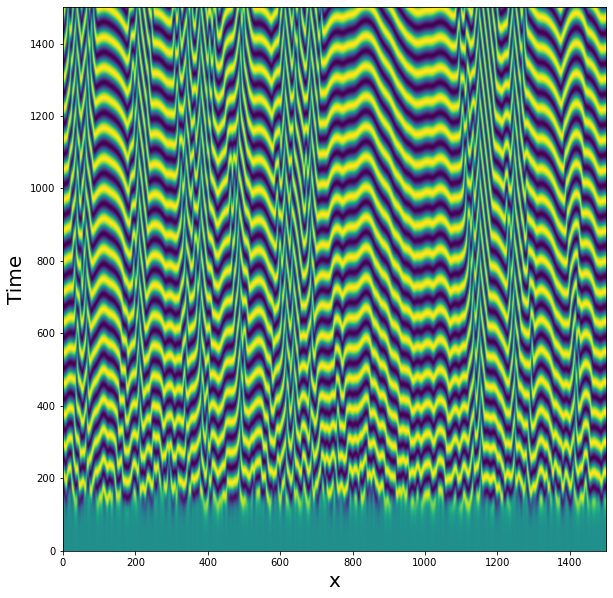

In [14]:
plt.figure(figsize = (10,10))
plt.imshow(np.real(data),origin='lower')
plt.ylabel("Time",fontsize=20)
plt.xlabel("x",fontsize=20)
plt.show()

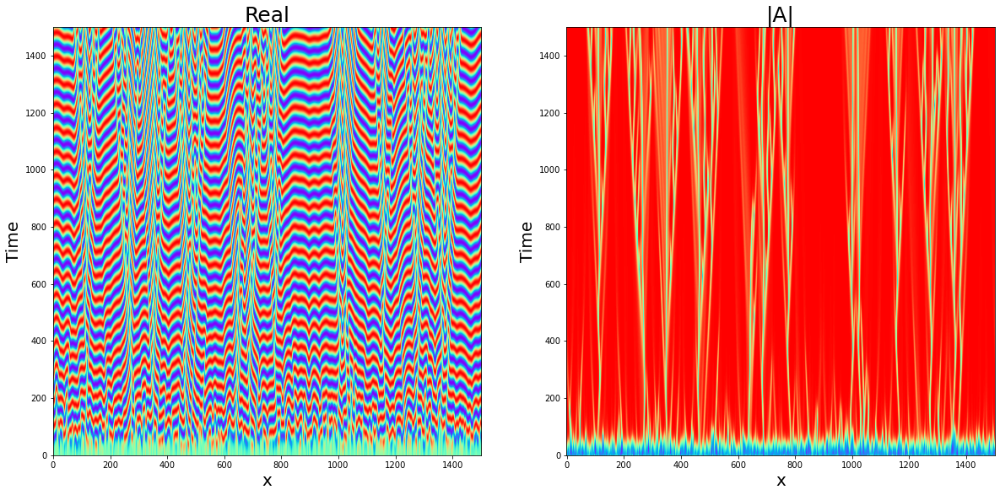

In [8]:
plt.figure(figsize = (20,10))
plt.subplot(1,2,1)
plt.imshow(np.real(data),origin='lower',cmap='rainbow')
plt.ylabel("Time",fontsize=20)
plt.xlabel("x",fontsize=20)
plt.title("Real",fontsize=25)

plt.subplot(1,2,2)
plt.imshow(np.abs(data),origin='lower',cmap='rainbow')
plt.ylabel("Time",fontsize=20)
plt.xlabel("x",fontsize=20)
plt.title("|A|",fontsize=25)


plt.show()